# Student: Carlos Garcia Garcia
# NOPH02 Hot topics in nanopthonics

## Miniproject 1 -- Retrieval of the opto-geometric parameters of a multilayer structure from far-field spectral information.
## For confidence interval (CI), I'll use:


$\large CI=\bar x \pm z \sigma_{x}$

Where $\bar x$ is the mean value of the variable $x$, $z$ is the z-factor and, $\sigma_{x}$ is the standard deviation of the variable $x$.

In [1]:
#Importing the libraries I'll use later on.
import matplotlib.pyplot as plt 
import numpy as np
import pandas as pd

import time
import pygad
import PyMoosh as PM

Text(0, 0.5, 'Transmitance')

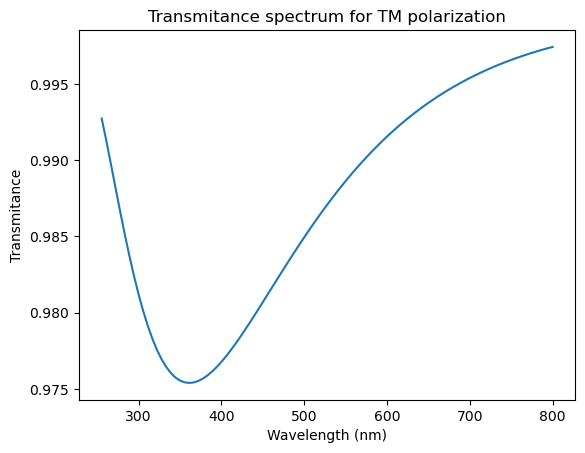

In [3]:
#Import the spectrum from the csv file using pandas library separating the values of each row with semicolon ";".
file = pd.read_csv("MP1-SpecTr-mystery.csv",delimiter= ';')
wl=file.values[:,0]#Wavelength data from the csv file
T_target=file.values[:,1]#Transmitance data from the csv file.

plt.plot(wl,T_target)#Plot of the target spectrum.
plt.title('Transmitance spectrum for TM polarization')
plt.xlabel('Wavelength (nm)')
plt.ylabel('Transmitance')

In [4]:
#I define the Spectrum function to input the structure, i.e. the film with starting parameters and then to compare with our target spectrum.
def Spectrum(structure,incidence,polarization,wl_min,wl_max,n_wl):
    r=np.zeros(n_wl,dtype=complex)
    t=np.zeros(n_wl,dtype=complex)#Thickness of the first layer
    t2=np.zeros(n_wl,dtype=complex)#Thickness of the second layer
    R=np.zeros(n_wl)
    T=np.zeros(n_wl)
    wl=np.linspace(wl_min,wl_max,n_wl)
    theta=incidence/180*np.pi
    for k in range(n_wl):
        r[k],t[k],R[k],T[k]=PM.coefficient(structure,wl[k],theta,polarization)
    return wl,r,t,t2,R,T

#These are the initial parameters of our film
##rad2deg=180.0/np.pi##
pol=1#TM polarization
##thetid=0.0##
wlmin=min(wl)
wlmax=max(wl)
nlamb=len(wl)
eps_inc=1.0
eps_subs=1.46**2
##eps_film='Silver'##
##t_tar= 110.0 ##

In [5]:
def fitness_func(ga_instance,solution, solution_idx):
    thetaid = solution[0]#Incident angle
    t_gad = solution[1]#Thickness 1
    t_gad2=solution[2]#Thickness 2
    film=PM.Structure([eps_inc,1.37**2,1.76**2,eps_subs],[0,1,2,3],[1000,t_gad,t_gad2,1000])#Structure of the two layers.
    [wl,r_gad,t_gad,t_gad2,R_gad,T_gad]=Spectrum(film,thetaid,pol,wlmin,wlmax,nlamb)
    #
    #
    norme=np.linalg.norm(T_target-T_gad)
    #
    #
    fitness=-norme
 
    return fitness

In [6]:
#### pyGAD parameters.

num_generations = 70               # Number of generations.
num_parents_mating = 25           # Number of solutions to be selected for recombination.
sol_per_pop = 70                   # Number of solutions in the population.
num_genes = 3                      # Number of variables of interest: Two thicknesses and one incident angle.
crossover_type = "uniform"
mutation_type = "random"
mutation_percent_genes = 0.15
parent_selection_type="sss"
last_fitness = 0
def on_generation(ga_instance):
    global last_fitness
    print("Generation = {generation}".format(generation=ga_instance.generations_completed))
    best_solution = ga_instance.best_solution(pop_fitness=ga_instance.last_generation_fitness)[0]
    last_fitness = ga_instance.best_solution(pop_fitness=ga_instance.last_generation_fitness)[1]
    

Work in progress ...

List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilo

List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997


List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997


List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997


List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997


List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997


List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997


List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997


List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997


List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997


List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997


List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997


List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997


Generation = 7
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.13

List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997


List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997


List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
Generation = 9
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.13

List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997


List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997


List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997


List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997


List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997


List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997


List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997


List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997


List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997


List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997


List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997


List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997


List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997


List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997


List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997


List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997


List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997


List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997


List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997


List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997


List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997


List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997


List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997


List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997


List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997


List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997


List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997


List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997


List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997


List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997


List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997


List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997


List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997


List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997


List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997


List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997


List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997


List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997


List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997


List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997


List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997


List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
Generation = 36
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1

List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997


List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997


List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997


List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997


List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997


List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997


List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997


List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
Generation = 41
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1

List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997


List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997


List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997


List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997


List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997


List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997


List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997


List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997


List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997


List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997


List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
Generation = 48
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1

List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997


List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997


List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997


List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997


List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997


List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997


List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997


List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
Generation = 53
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1

List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997


List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997


List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997


List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997


List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997


List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997


List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997


List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
Generation = 58
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1

List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997


List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997


List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997


List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997


List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997


List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997


List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997


List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
Generation = 63
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1

List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997


List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997


List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997


List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997


List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997


List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997


List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997


List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997


List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997


List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


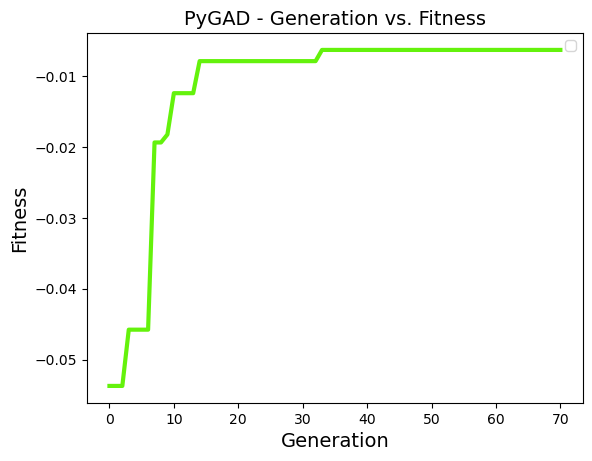

Parameters of the best solution : [ 58.210367  104.0881838  44.9892933]
fitness value of the best solution = -0.006266642369048863
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non d

List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997


List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997


List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997


List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997


List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997


List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997


List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997


List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
Generation = 4
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.13

List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997


List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997


List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997


List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997


List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997


List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997


List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997


Generation = 9
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.13

List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997


List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997


List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997


List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997


List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997


List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997


List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997


List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997


List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997


List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997


List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997


List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997


List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997


List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
Generation = 18
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1

List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997


List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997


List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997


List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997


List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997


List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
Generation = 22
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1

List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997


List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997


List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997


List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997


List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997


List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997


List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997


List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997


List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997


List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997


List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997


List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997


List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997


List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997


List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997


List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997


List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997


List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997


List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997


List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997


List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997


List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997


List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997


List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997


List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997


List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997


List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997


List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997


List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997


List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
Generation = 41
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1

List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997


List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997


List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997


List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997


List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997


List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997


List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997


List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997


List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997


List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997


List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997


List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997


List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997


List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997


List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997


List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997


List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997


List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997


List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
Generation = 53
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1

List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997


List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997


List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997


List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997


List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997


List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
Generation = 57
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1

List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997


List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997


List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997


List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997


List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997


List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997


List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997


List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997


List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997


List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997


List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997


List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997


List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997


List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997


List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997


List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997


List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997


List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997


List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
Generation = 69
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1

List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997


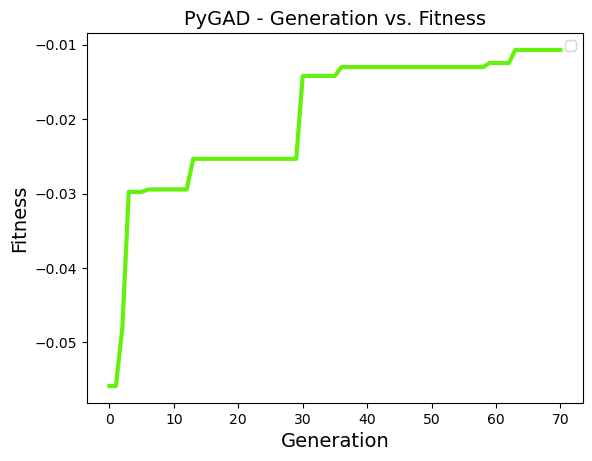

Parameters of the best solution : [57.98414475 98.65918718 48.53776381]
fitness value of the best solution = -0.010698200494773987
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non d

List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997


List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997


List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997


List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997


List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997


List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997


List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997


List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997


List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997


List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997


List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997


List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997


List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997


List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997


List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997


List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997


List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997


List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997


List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997


List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
Generation = 12
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1

List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997


List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997


List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
Generation = 14
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1

List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997


List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997


List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997


List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997


List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997


List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997


List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997


List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997


List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997


List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997


List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997


List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997


List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997


List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997


List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
Generation = 24
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1

List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997


List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997


List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
Generation = 26
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1

List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997


List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997


List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997


List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997


List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997


List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997


List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997


List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997


List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997


List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997


List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
Generation = 33
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1

List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997


List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997


List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997


List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997


List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997


List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997


List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997


List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997


List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997


List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997


List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997


List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997


List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997


List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997


List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997


List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997


List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997


List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997


List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997


List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997


List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997


List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997


List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997


List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997


List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997


List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997


List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997


List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997


List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997


List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997


List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997


List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997


List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997


List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997


List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997


List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997


List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997


List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997


List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997


List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997


List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997


List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997


List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997


List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997


List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997


List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997


List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997


List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997


List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
Generation = 65
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1

List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997


List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997


List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997


List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997


List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997


List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997


List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997


List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


Generation = 70


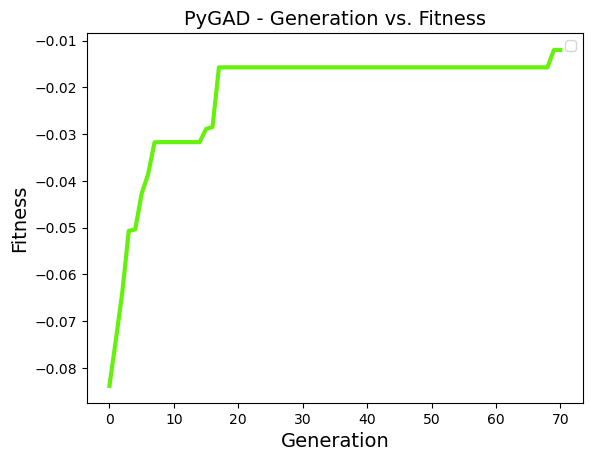

Parameters of the best solution : [ 59.87090876 105.14990532  35.4123303 ]
fitness value of the best solution = -0.011964660345030945
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, no

List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997


List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997


List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
Generation = 1
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.13

List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997


List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997


List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
Generation = 3
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.13

List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997


List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997


List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997


List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997


List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997


List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997


List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997


List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
Generation = 8
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.13

List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997


List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997


List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997


List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997


List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997


List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997


List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997


List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997


List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997


List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997


List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
Generation = 15
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1

List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997


List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997


List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997


List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997


List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997


List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997


List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997


List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
Generation = 20
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1

List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997


List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997


List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997


List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997


List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997


List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997


List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997


List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997


List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997


List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997


List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997


List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997


List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997


List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997


List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997


List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997


List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997


List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997


List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997


List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
Generation = 33
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1

List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997


List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997


List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997


List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997


List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997


List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997


List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997


List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997


List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997


List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997


List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997


List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997


List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997


List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997


List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997


List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997


List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997


List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997


List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997


List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997


List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997


List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997


List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997


List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997


Generation = 49
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1

List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997


List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997


List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997


List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997


List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997


List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997


List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997


List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997


List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997


List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997


List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997


List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997


List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997


List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
Generation = 58
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1

List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997


List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997


List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997


List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997


List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997


List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997


List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997


List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997


List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997


List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997


List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997


List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997


List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997


List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
Generation = 67
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1

List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997


List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997


List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997


List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997


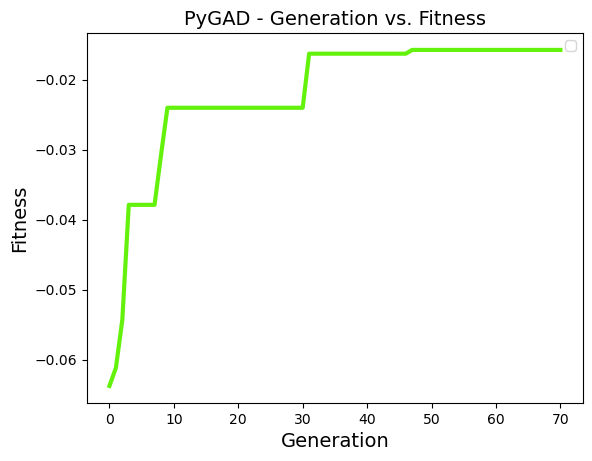

Parameters of the best solution : [56.8280418  83.97400671 55.25489572]
fitness value of the best solution = -0.015754924046285913
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non d

List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997


List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997


List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
Generation = 1
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.13

List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997


List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997


List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997


List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997


List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997


List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997


List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997


List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997


List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997


List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997


List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997


List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997


List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997


List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997


List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997


List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997


Generation = 12
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1

List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997


List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997


List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
Generation = 14
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1

List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997


List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997


List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997


List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997


List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997


List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997


List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997


List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997


List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997


List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997


List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997


List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997


List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997


List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
Generation = 23
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1

List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997


List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997


List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997


List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997


List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997


List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997


List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997


List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997


List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997


List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997


List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997


List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997


List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997


List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997


List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997


List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997


List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997


List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997


List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997


List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997


List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997


List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997


List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997


List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997


List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997


List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997


List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997


List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997


List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997


List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997


List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997


List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997


List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
Generation = 44
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1

List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997


List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997


List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997


List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997


List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997


List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997


List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997


List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997


List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997


List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997


List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
Generation = 51
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1

List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997


List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997


List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997


List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997


List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997


List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997


List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997


List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
Generation = 56
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1

List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997


List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997


List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997


List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997


List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997


List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997


List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997


List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997


List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997


List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997


List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997


List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997


List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997


List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997


List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997


List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997


List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997


List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997


List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997


List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997


List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
Generation = 70


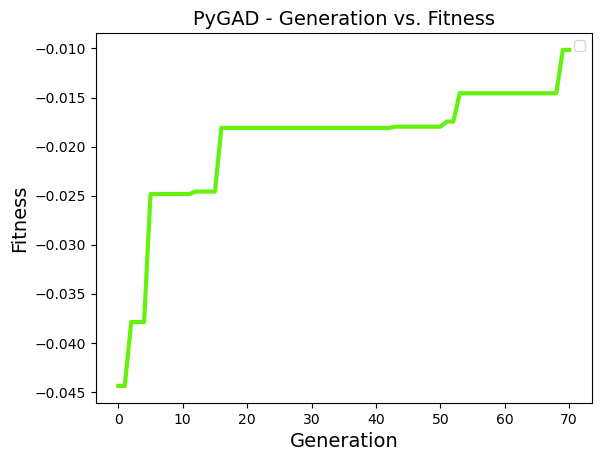

Parameters of the best solution : [59.18309204 51.81968467 76.27536541]
fitness value of the best solution = -0.010146930902775356
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non d

List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997


List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997


List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997


List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997


List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997


List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997


List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997


List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
Generation = 4
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.13

List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997


List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997


List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997


List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997


List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997


List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997


List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997


List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997


List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997


List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997


List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997


List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997


List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997


List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997


List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997


List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997


List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997


List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997


List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997


List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997


List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997


List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997


List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997


List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997


List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997


List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997


List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997


List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997


List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
Generation = 23
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1

List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997


List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997


List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997


List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997


List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997


List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997


List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997


List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997


List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997


List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997


List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997


List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997


List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997


Generation = 32
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1

List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997


List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997


List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
Generation = 34
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1

List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997


List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997


List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
Generation = 36
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1

List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997


List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997


List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997


List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997


List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997


List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997


List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997


List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
Generation = 41
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1

List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997


List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997


List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997


List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997


List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997


List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997


List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997


List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997


List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997


List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997


List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
Generation = 48
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1

List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997


List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997


Generation = 50
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1

List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997


List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997


List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997


List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997


List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997


List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
Generation = 54
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1

List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997


List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997


List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997


List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997


List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997


List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997


List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997


List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997


List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997


List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997


List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
Generation = 61
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1

List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997


List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997


List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997


List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997


List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997


List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997


List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997


List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997


List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997


List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997


List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997


List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997


List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
Generation = 70


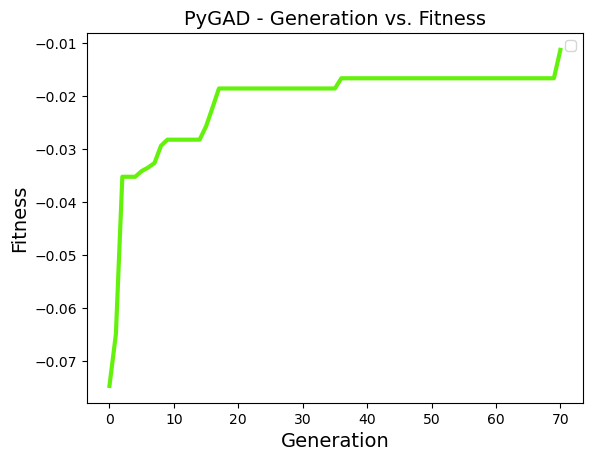

Parameters of the best solution : [ 57.25105928 100.72798385  46.07471116]
fitness value of the best solution = -0.011287939447063668
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, no

List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997


List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997


List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997


List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997


List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997


List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
Generation = 3
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.13

List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997


List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997


List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997


List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997


List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997


List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997


List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997


List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997


List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997


List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997


List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997


List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997


List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997


List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997


List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997


List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
Generation = 13
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1

List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997


List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997


List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997


List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997


Generation = 16
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1

List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997


List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997


List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997


List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997


List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997


List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997


List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997


List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997


List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997


List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997


List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997


List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997


List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997


List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997


List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997


List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997


List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997


List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997


List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997


List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997


List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997


List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997


List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997


List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997


List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
Generation = 32
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1

List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997


List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997


List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997


List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997


List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997


List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997


List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997


List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997


List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997


List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997


Generation = 39
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1

List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997


List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997


List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997


List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997


List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997


List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997


List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997


List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997


List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997


List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997


List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997


List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997


List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997


List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997


List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997


List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997


List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
Generation = 50
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1

List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997


List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997


List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997


List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997


List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997


List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997


List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997


List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997


List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997


List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997


List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997


List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997


List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997


List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997


List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997


List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997


List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997


List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997


List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997


List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997


List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997


List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997


List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997


List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997


List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997


List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997


List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997


List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997


List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997


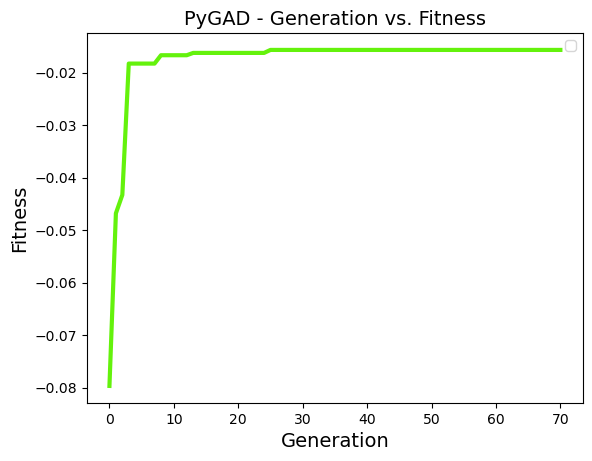

Parameters of the best solution : [56.89253335 89.2843187  55.16557767]
fitness value of the best solution = -0.01569666400663566
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non di

List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997


List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997


List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
Generation = 1
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.13

List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997


List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997


List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997


List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997


List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997


List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997


List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997


List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
Generation = 6
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.13

List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997


List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997


List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997


List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997


List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997


List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997


List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997


List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997


List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997


List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997


List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997


List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997


List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997


List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997


List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997


List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997


List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997


List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997


Generation = 18
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1

List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997


List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997


List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997


List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997


List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997


List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997


List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997


List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997


List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997


List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997


List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
Generation = 25
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1

List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997


List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997


List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
Generation = 27
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1

List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997


List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997


List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997


List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997


List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997


List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997


List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997


List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997


List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997


List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997


List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997


List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997


List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997


List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997


List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997


List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997


List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997


List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997


List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997


List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997


List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997


List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997


List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997


List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997


List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997


List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997


List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997


List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997


List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997


List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997


List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
Generation = 47
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1

List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997


List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997


List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997


List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997


List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997


List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997


List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997


List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997


List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997


List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997


List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
Generation = 54
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1

List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997


List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997


List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997


List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997


List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997


List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997


List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997


List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997


List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997


List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997


List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
Generation = 61
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1

List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997


List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997


List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997


List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997


List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997


List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997


List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997


Generation = 66
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1

List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997


List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997


List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997


List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997


List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997


List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
Generation = 70


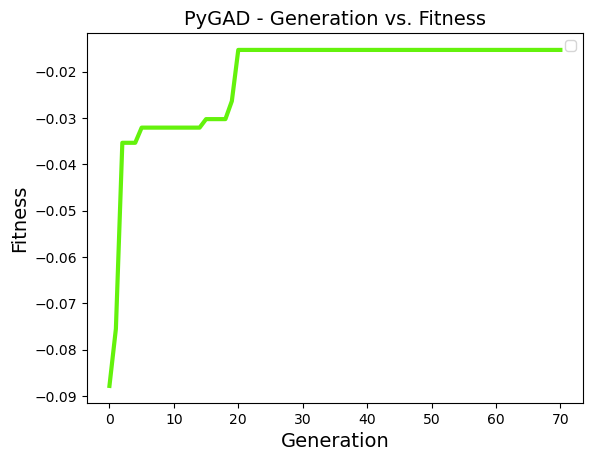

Parameters of the best solution : [56.88733845 89.66797819 50.98722669]
fitness value of the best solution = -0.015303723786830046
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non d

List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997


List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997


List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997


List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997


List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997


List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997


List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997


List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997


List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997


List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997


List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997


List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997


List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997


List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997


List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997


List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
Generation = 9
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.13

List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997


List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997


List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997


List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997


List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997


List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997


List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997


List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997


List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997


List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997


List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
Generation = 16
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1

List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997


List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997


List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997


List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997


List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997


List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997


List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997


List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
Generation = 21
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1

List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997


List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997


List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
Generation = 23
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1

List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997


List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997


List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997


List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997


List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997


List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997


List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997


List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997


List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997


List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997


List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997


List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997


List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997


List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
Generation = 32
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1

List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997


List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997


List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997


List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997


List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997


List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997


List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997


List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997


List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997


List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997


List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997


List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997


List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997


List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997


List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997


List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997


List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997


List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997


List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997


List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997


List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997


List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997


List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997


List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997


List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997


List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
Generation = 49
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1

List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997


List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997


List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997


List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997


List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997


List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997


List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997


List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997


List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997


List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997


List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
Generation = 56
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1

List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997


List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997


List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997


List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997


List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997


List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997


List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997


List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997


List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997


List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997


List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997


List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997


List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997


List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
Generation = 65
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1

List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997


List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997


List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997


List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997


List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
Generation = 68
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1

List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997


List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997


List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


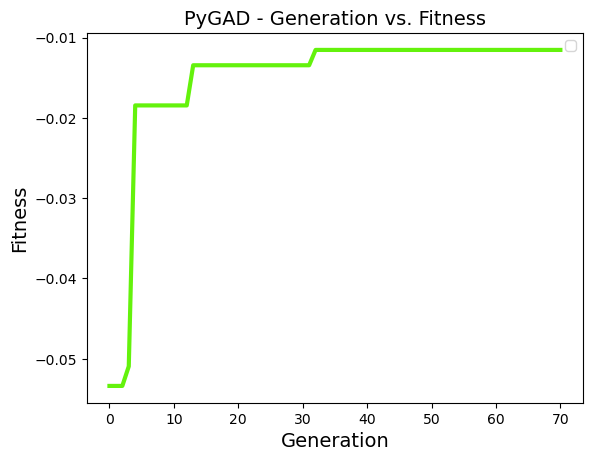

Parameters of the best solution : [57.31119834 97.41551053 47.11821556]
fitness value of the best solution = -0.011545471298824612
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non d

List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997


List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997


List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997


List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997


List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997


List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997


List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997


List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997


List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997


List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997


List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997


List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997


List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997


List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
Generation = 8
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.13

List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997


List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997


List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997


List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997


List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997


List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997


List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997


List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997


List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997


List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997


List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997


List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997


List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997


List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997


List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997


List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997


List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997


List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997


List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
Generation = 20
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1

List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997


List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997


List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
Generation = 22
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1

List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997


List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997


List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997


List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997


List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997


List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997


List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997


List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997


List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997


List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997


List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997


List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997


List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997


List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
Generation = 31
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1

List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997


List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997


List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997


List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997


List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997


List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
Generation = 35
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1

List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997


List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997


Generation = 37
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1

List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997


List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997


List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997


List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997


List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997


List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997


List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997


List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997


List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997


List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997


List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997


List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997


List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997


List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997


List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997


List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997


List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997


List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997


List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997


List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997


List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997


List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997


List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997


List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997


List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997


List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997


List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997


List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
Generation = 55
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1

List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997


List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997


List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997


List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997


List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
Generation = 58
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1

List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997


List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997


List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997


List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997


List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997


List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997


List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997


List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997


List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997


List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997


List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997


List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997


List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997


List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997


List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997


List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997


List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997


List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
Generation = 70


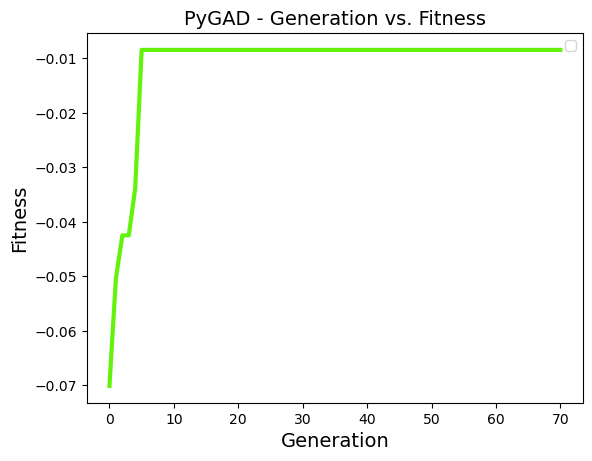

Parameters of the best solution : [58.74375939 53.75449008 72.80215467]
fitness value of the best solution = -0.008450566023541285

 The elapsed time is  22.915519869327547 minutes


In [11]:
samples=10 #How many thetas, thicknesses1 and thicknesses2 we want to store. samples=n means that we'll have n thetas, n thicknesses1, n thicknesses2.
#To store the solution of each iteration. Each element of ssolution will have three values the incident angle, thickness1 and thickness2.
ssolution=[]
print('Work in progress ...\n')
start_time=time.time() # To measure the elapsed time.

for k in range(samples):    #To generate n plots when samples=n. 

    ga_instance = pygad.GA(num_generations=num_generations,
                           gene_space=[{"low":0, "high":90},{"low":10, "high":500},{"low":10, "high":500}], #We add an extra range corresponding to the thickness2
                           num_parents_mating=num_parents_mating,
                           sol_per_pop=sol_per_pop,
                           num_genes=num_genes,
                           fitness_func=fitness_func,
                           on_generation=on_generation,
                           crossover_type=crossover_type, 
                           mutation_type=mutation_type,
                           mutation_percent_genes=mutation_percent_genes,
                          parent_selection_type=parent_selection_type)


    ga_instance.run()        # This instruction executes the genetic algorithm       

    ga_instance.plot_fitness()  # This instruction plots the convergence fitness vs generations.

    # Returning the details of the best solution.
    solution, solution_fitness, solution_idx = ga_instance.best_solution(ga_instance.last_generation_fitness)
    print("Parameters of the best solution : {solution}".format(solution=solution))
    print("fitness value of the best solution = {solution_fitness}".format(solution_fitness=solution_fitness))

    
    ssolution.append(solution) #To store the solution of iteration k without loosing the previous one.
    
elapsed_time=(time.time()-start_time)/60 #We put the elapsed time to measure the time after the iteration, not the time of each iteration.

print("\n The elapsed time is " ,elapsed_time, "minutes")

List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997


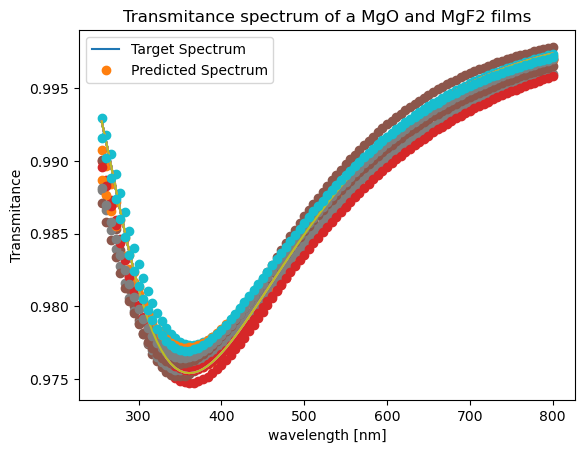

In [12]:
#Multiple plots of the several solutions and the target spectra.
for k in range(len(ssolution)):    
    film=PM.Structure([eps_inc,1.37**2,1.76**2,eps_subs],[0,1,2,3],[1000,ssolution[k][1],ssolution[k][2],1000])#Structure of our optimal values.
    [wl,r_opt,t_opt,t_opt2,R_opt,T_opt]=Spectrum(film,ssolution[k][0],pol,wlmin,wlmax,nlamb)#Spectrum with our optimal values.

    #
    #
    norme=np.sum((T_target-T_opt)**2)#We compare the target spectrum with the optimal spectrum
    fitness_value=1.0/(norme+ 0.000001)
    #
    #
    plt.plot(wl,T_target,wl,T_opt,"o")#Plot of both target spectrum and optimal spectrum.
    plt.title("Transmitance spectrum of a MgO and MgF2 films")
    plt.xlabel("wavelength [nm]")
    plt.ylabel('Transmitance')
    #
    #
    plt.legend(['Target Spectrum','Predicted Spectrum'])

In [13]:
#Put thetas, thicknesses 1 and 2 in an array to calculate their avarages and then their standar deviations.
thetas=[]
thicknesses1=[]
thicknesses2=[]
for k in range(len(ssolution)):
    thetas.append(ssolution[k][0])#Add all the thetas from our iteration.
    thicknesses1.append(ssolution[k][1])#Add all the thicknesses1 from our iteration.
    thicknesses2.append(ssolution[k][2])#Add all the thicknesses2 from our iteration.

th_av=np.mean(thetas)#Maan of our thetas.
th1_av=np.mean(thicknesses1)#Mean of our thicknesses1.
th2_av=np.mean(thicknesses2)#Mean of our thicknesses2.

#z=1.645    #To put in confidence interval for each variable at 90% of confidence (ie z=1.645)
z=1.96     #To put in confidence interval for each variable at 95% of confidence (ie z=1.96)
#z=2.33     #To put in confidence interval for each variable at 98% of confidence (ie z=2.33)

#We use the equation from the begining to establish the confidence interval.
print("Confidence interval of theta = {} +- {}".format(th_av,z*np.std(thetas)))
print("Confidence interval of thickness1 = {} +- {}".format(th1_av,z*np.std(thicknesses1)))
print("Confidence interval of thickness2 = {} +- {}".format(th2_av,z*np.std(thicknesses2)))

Confidence interval of theta = 57.916244316467804 +- 1.9892681062329842
Confidence interval of thickness1 = 87.45412490309086 +- 36.229003984209
Confidence interval of thickness2 = 53.2617534302171 +- 23.380528283754796


List of materials:
Simple, non dispersive: epsilon= 1.0
Simple, non dispersive: epsilon= 1.8769000000000002
Simple, non dispersive: epsilon= 3.0976
Simple, non dispersive: epsilon= 2.1315999999999997
Fitness of the best solution : 2879.7566198122636
Best fitness value reached after 5 generations.


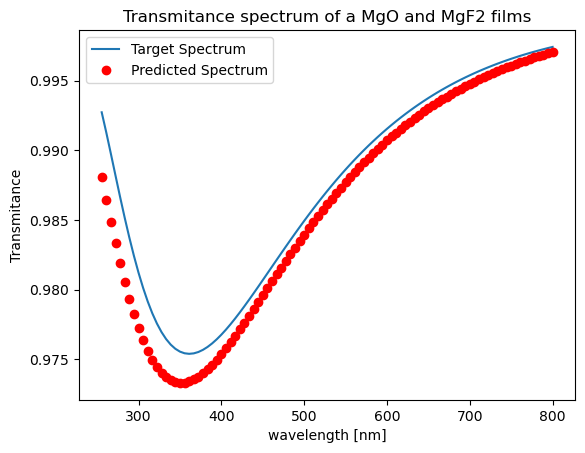

In [14]:
#Plot the Target spectrum and the avaraged values of theta, thickness1 and thickness2.
film=PM.Structure([eps_inc,1.37**2,1.76**2,eps_subs],[0,1,2,3],[1000,th1_av,th2_av,1000])
[wl,r_opt,t_opt,t_opt2,R_opt,T_opt]=Spectrum(film,th_av,pol,wlmin,wlmax,nlamb)
#
#
norme=np.sum((T_target-T_opt)**2)
fitness_value=1.0/(norme+ 0.000001)
#
#

print("Fitness of the best solution : {fitness}".format(fitness=fitness_value))
if ga_instance.best_solution_generation != -1:
    print("Best fitness value reached after {best_solution_generation} generations.".format(best_solution_generation=ga_instance.best_solution_generation))

#
#
plt.plot(wl,T_target,wl,T_opt,"ro")
plt.title("Transmitance spectrum of a MgO and MgF2 films")
plt.xlabel("wavelength [nm]")
plt.ylabel('Transmitance')
#
#
plt.legend(['Target Spectrum','Predicted Spectrum'])